# Задача 6. Компьютерное зрение: задача сегментации

Автор: Полынцов Михаил, 23.М04-мм.

- [✔] Сделать train/test split (или кросс-валидацию), зафиксировать все сиды чтобы более-менее воспроизводились результаты. Добавить метрику jaccard index. Переобучиться на одном батче (например 4 картинки), попробовать получить почти идеальное качество, посмотреть получилось или нет. Посчитать метрики для батча и для теста. Обучить на всем train, построить train/val кривые для loss и для jaccard index, подобрать оптимальное время обучения (количество шагов) для фиксированных параметров. Визуализировать topN самых плохих предсказаний.
- [✔] Попробовать улучшить качество не меняя архитектуру: аугментации, гиперпараметры. Сделать test time аугментации через horizontal flip, посмотреть улучшается ли что-то.
- [✔] Попробовать улучшить качество изменяя архитектуру.
- [] * (+2 балла) Сделать train/test разбиение. Внутри train сделать 5fold, обучить 5 моделей. Построить кривые обучения для каждого фолда. Предсказать тест со всех 5 моделей и сагрегировать предсказания (до расчета метрик), сравнить с одной моделью обученной на всех данных. Сравнить с моделями обученными на фолдах. Сравнить плохие предсказания теста на разных фолдах. Ошибается на одних и тех же семплах или на разных?
- [] * (+3 балла) Сделать unet с pretrained энкодером (можно взять vgg или resnet18/34), сравнить с предыдущими пунктами.


In [45]:
import copy
import random
import seaborn as sns
from matplotlib import pyplot as plt
import pandas as pd
import torch
import torch.utils.data
import torchmetrics
from torch import nn
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset
from torchvision import io
from torchvision import transforms
from torchvision.transforms import functional
from tqdm.auto import tqdm, trange
from pathlib import Path
from torch.utils.data import Dataset
from typing import Callable, Optional, Tuple, Union, List

torch.manual_seed(42)
random.seed(42)

torch.cuda.empty_cache()

Реализуем Unet.

In [46]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, padding: int):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.double_conv(x)

class UNetEncoder(nn.Module):
    def __init__(self, in_channels: int, n_down: int, channels_factor: int = 2, padding: int = 1):
        super().__init__()

        self.enc_layers = nn.ModuleList([DoubleConv(in_channels, in_channels * channels_factor, padding)])

        for _ in range(n_down):
            in_channels *= channels_factor
            self.enc_layers.append(
                nn.Sequential(
                    nn.MaxPool2d(2, 2),
                    DoubleConv(in_channels, in_channels * channels_factor, padding)
                )
            )

    def forward(self, x: torch.Tensor) -> list[torch.Tensor]:
        results = []
        for layer in self.enc_layers:
            x = layer(x)
            results.append(x)
        return results

class UNetDecoder(nn.Module):
    def __init__(self, in_channels: int, n_up: int, channels_divisor: int = 2, padding: int = 1):
        super().__init__()

        self.dec_layers = nn.ModuleList()
        for _ in range(n_up):
            out_channels = in_channels // channels_divisor
            self.dec_layers.append(
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
            )
            self.dec_layers.append(
                DoubleConv(in_channels, out_channels, padding)
            )
            in_channels = out_channels

    def forward(self, x: torch.Tensor, residuals: list[torch.Tensor]) -> torch.Tensor:
        assert len(residuals) == len(self.dec_layers) // 2, "Mismatch in number of residuals and decoder layers"

        for i in range(0, len(self.dec_layers), 2):
            up_conv = self.dec_layers[i]
            double_conv = self.dec_layers[i+1]
            residual = residuals[-(i//2+1)]

            x = up_conv(x)
            h_diff = residual.size(2) - x.size(2)
            w_diff = residual.size(3) - x.size(3)
            if h_diff > 0 or w_diff > 0:
                x = nn.functional.pad(x, [0, w_diff, 0, h_diff])

            x = torch.cat([residual, x], dim=1)
            x = double_conv(x)
            
        return x

class UNet(nn.Module):
    def __init__(self, in_channels: int = 3, out_channels: int = 1, n_levels: int = 4):
        super().__init__()

        self.encoder = UNetEncoder(in_channels=in_channels, n_down=n_levels)
        encoder_out_channels = in_channels * (2 ** (n_levels + 1))
        self.decoder = UNetDecoder(in_channels=encoder_out_channels, n_up=n_levels)
        self.out_conv = nn.Conv2d(in_channels=in_channels * 2, out_channels=out_channels, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residuals = self.encoder(x)
        x = self.decoder(residuals[-1], residuals[:-1])
        x = self.out_conv(x)
        return x

In [47]:
class PortraitDataset(Dataset):
    def __init__(self, images: List[Union[Path, str]], masks: List[Union[Path, str]], transform: Callable = None):
        self.images = images
        self.masks = masks
        self.transform = transform if transform else lambda x: x
        assert len(self.images) == len(self.masks), "The number of images and masks must be the same."

    def __len__(self) -> int:
        return len(self.images)

    def __getitem__(self, index: int) -> Tuple[torch.Tensor, torch.Tensor]:
        image_path = str(self.images[index])
        mask_path = str(self.masks[index])

        image = io.read_image(image_path).float() / 255.0
        mask = io.read_image(mask_path).float() / 255.0

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask

def show_images(image1: torch.Tensor, image2: torch.Tensor, title: str = None):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    if title:
        fig.suptitle(title)

    axes[0].imshow(functional.to_pil_image(image1))
    axes[0].axis('off')
    axes[0].set_title('Original image')

    axes[1].imshow(functional.to_pil_image(image2))
    axes[1].axis('off')
    axes[1].set_title('Segmentated image')

    plt.show()

Разобъем выборку на тестовую и обучающую.

Train size: 1800
Test size: 200


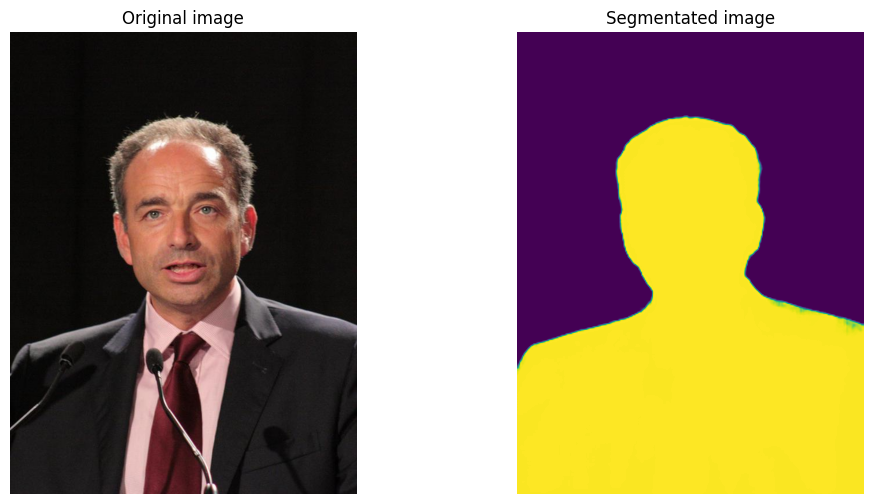

In [48]:
image_paths = sorted(Path("task06/dataset/images").iterdir())
mask_paths = sorted(Path("task06/dataset/masks").iterdir())

paths = list(zip(image_paths, mask_paths))
random.shuffle(paths)
image_paths, mask_paths = zip(*paths)

train_portion = 0.9
split_index = int(len(image_paths) * train_portion)

train_dataset = PortraitDataset(
    images=image_paths[:split_index],
    masks=mask_paths[:split_index]
)
test_dataset = PortraitDataset(
    images=image_paths[split_index:],
    masks=mask_paths[split_index:]
)

print("Train size:", len(train_dataset))
print("Test size:", len(test_dataset))

image, mask = train_dataset[0]
show_images(image, mask)

Реализуем функцию для построения графиков с метриками.

In [49]:
def plot_func(results: pd.DataFrame, metric: str, ax, values: bool = True):
    sns.lineplot(
        data=results[results["Function"] == metric],
        x="Epoch",
        y="Value",
        hue="Dataset",
        marker="o",
        ax=ax,
    )
    ax.set_title(metric)

    if values:
        for _, row in results[results["Function"] == metric].iterrows():
            ax.text(
                row["Epoch"], row["Value"],
                f"{row['Value']:.3f}",
                horizontalalignment="center",
                verticalalignment="top" if row["Dataset"] == "Train" else "bottom",
                color="midnightblue" if row["Dataset"] == "Train" else "saddlebrown",
            )

def plot(results: pd.DataFrame, title: str, values: bool = True):
    fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(15, 7))

    plot_func(results, "Loss", ax[0], values)
    plot_func(results, "Jaccard", ax[1], values)

    fig.suptitle(title)
    fig.tight_layout()
    plt.show()

Реализуем функции для обучения и тестирования.

In [50]:

loss_fn = nn.BCEWithLogitsLoss()
jaccard_index = torchmetrics.JaccardIndex(task="binary")
jaccard = lambda pred, y: jaccard_index(pred.cpu(), y.cpu() > jaccard_index.threshold)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train_epoch(
        model: nn.Module,
        optimizer: optim.Optimizer,
        loader: DataLoader,
        loss_fn: Callable,
        metric_fn: Callable,
        device: torch.device,
        show_progress: bool = True
) -> Tuple[float, float]:
    model.train()
    loss_sum = 0.0
    metric_sum = 0.0

    for X, y in tqdm(loader, desc="Training batch", disable=not show_progress):
        X, y = X.to(device), y.to(device)

        optimizer.zero_grad()
        pred = model(X)
        loss = loss_fn(pred, y)
        loss.backward()
        optimizer.step()

        metric = metric_fn(pred, y)
        loss_sum += loss.item()
        metric_sum += metric.item()

    return loss_sum / len(loader), metric_sum / len(loader)

def evaluate(
        model: nn.Module,
        loader: DataLoader,
        loss_fn: Callable,
        metric_fn: Callable,
        device: torch.device,
        show_progress: bool = True
) -> Tuple[float, float]:
    model.eval()
    loss_sum = 0.0
    metric_sum = 0.0

    with torch.no_grad():
        for X, y in tqdm(loader, desc="Evaluating batch", disable=not show_progress):
            X, y = X.to(device), y.to(device)
            pred = model(X)
            loss = loss_fn(pred, y)
            metric = metric_fn(pred, y)
            loss_sum += loss.item()
            metric_sum += metric.item()

    return loss_sum / len(loader), metric_sum / len(loader)

def train(
        model: nn.Module,
        optimizer: optim.Optimizer,
        train_loader: DataLoader,
        test_loader: DataLoader,
        loss_fn: Callable,
        metric_fn: Callable,
        epochs: int,
        device: torch.device,
        show_detailed_progress: bool = True,
        artifacts: Optional[Union[Path, str]] = None
) -> pd.DataFrame:
    if artifacts is not None:
        artifacts = Path(artifacts)
        artifacts.mkdir(parents=True, exist_ok=True)

    stats = []
    for epoch in trange(epochs, desc="Epoch"):
        train_loss, train_metric = train_epoch(
            model, optimizer, train_loader, loss_fn, metric_fn, device, show_detailed_progress
        )
        test_loss, test_metric = evaluate(
            model, test_loader, loss_fn, metric_fn, device, show_detailed_progress
        )
        stats.extend([
            (epoch, "Loss", "Train", train_loss),
            (epoch, "Jaccard", "Train", train_metric),
            (epoch, "Loss", "Test", test_loss),
            (epoch, "Jaccard", "Test", test_metric),
        ])

        if artifacts is not None:
            torch.save(model.state_dict(), artifacts / f"epoch_{epoch}.pt")

    return pd.DataFrame(stats, columns=["Epoch", "Function", "Dataset", "Value"])


In [146]:
batch_size = 4

train_loader = DataLoader(
    Subset(train_dataset, range(batch_size)),
    batch_size=batch_size,
)
test_loader = DataLoader(
    Subset(test_dataset, range(batch_size)),
    batch_size=batch_size,
)

model = UNet().to(device)
optimizer = optim.Adam(model.parameters())

train_results = train(
    model, optimizer, train_loader, test_loader,
    loss_fn, jaccard,
    epochs=100,
    device=device,
    show_detailed_progress=False
)

Epoch: 100%|██████████| 100/100 [00:15<00:00,  6.55it/s]


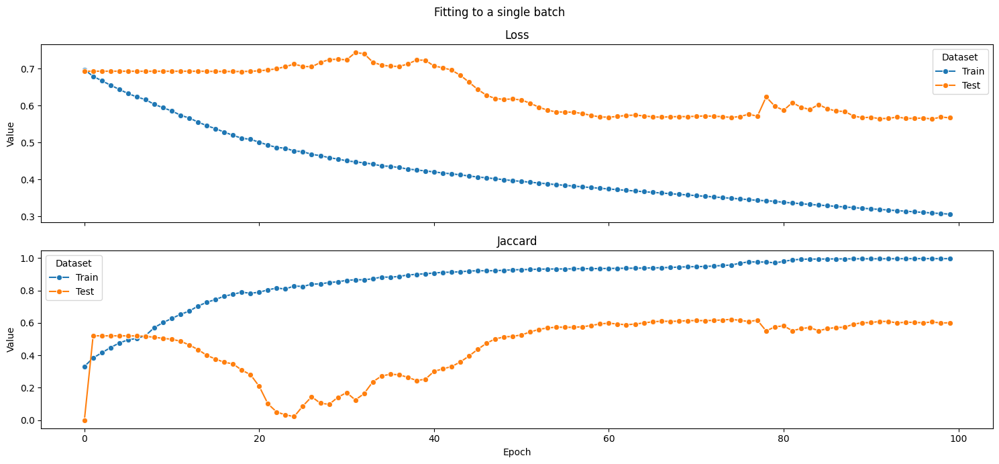

In [147]:
plot(train_results, 'Fitting to a single batch', values=False)

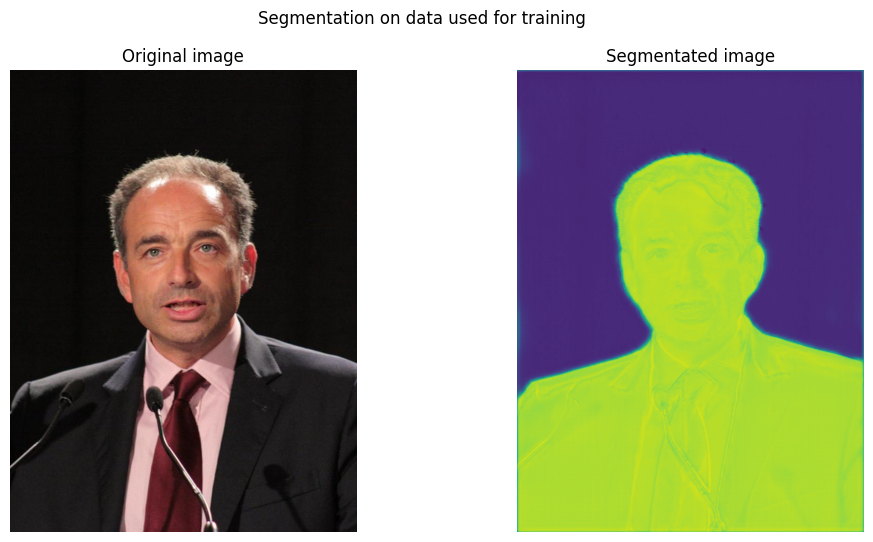

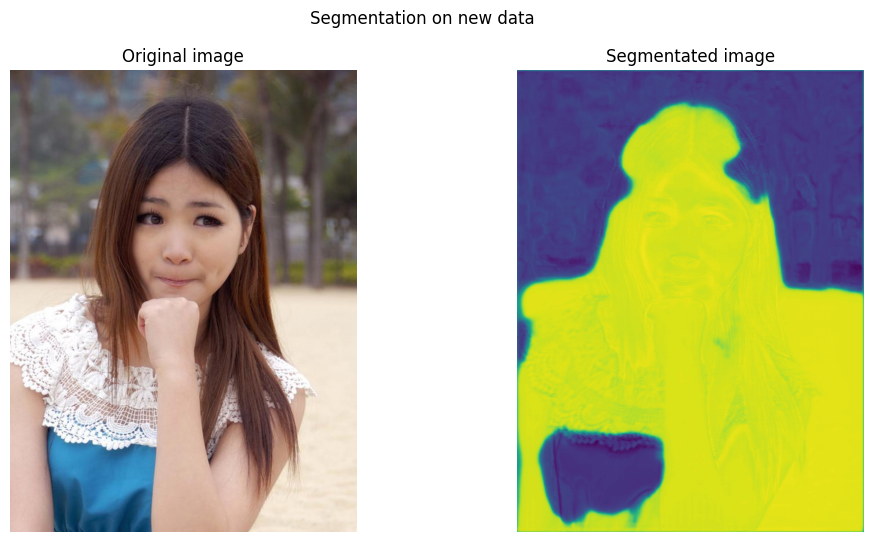

In [53]:
def visualize_predictions(model: nn.Module, dataset: torch.utils.data.Dataset, device: torch.device, title: str):
    model.eval()
    X, _ = dataset[0]
    with torch.no_grad():
        pred = model(X.to(device).unsqueeze(0))[0].cpu()
    show_images(X, torch.sigmoid(pred), title=title)

visualize_predictions(model, train_dataset, device, 'Segmentation on data used for training')
visualize_predictions(model, test_dataset, device, 'Segmentation on new data')

Можно видеть, что на изображении, которое использовалось при обучении, результат очень хороший, в то время как на новых данных -- очень плохой, что и ожидалось при переобучении.

In [ ]:
#%%script true
batch_size = 6

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)
model = UNet().to(device)
optimizer = torch.optim.Adam(model.parameters())

results = train(
    model, optimizer, train_loader, test_loader,
    loss_fn, jaccard,
    epochs=20,
    device=device,
    artifacts="task06/models/default",
)
results.to_csv("task06/models/default/results.csv")

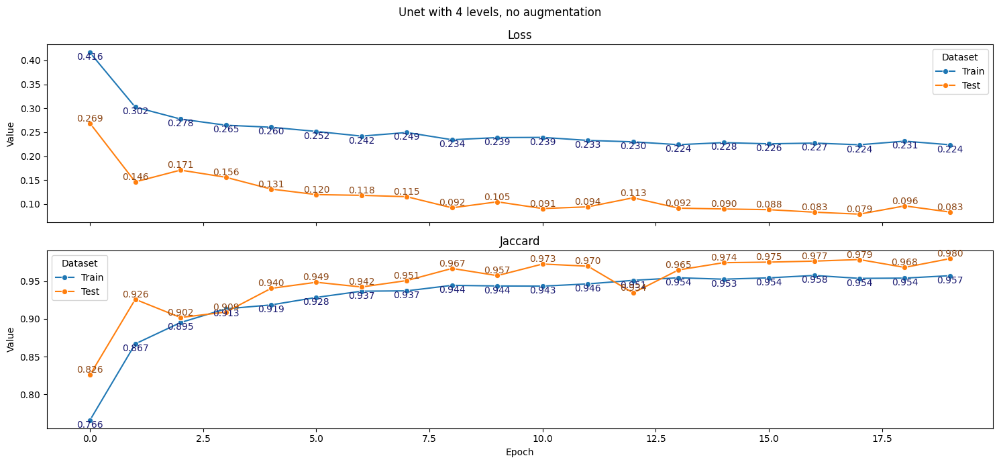

In [162]:
plot(results, "Unet with 4 levels, no augmentation")

После 10ой эпохи значения метрик на валидационном датасете выходит на асимптоту и почти не меняется, возьмём 11ую эпоху в качестве лучшей.

Посмотрим на 5 худших предсказаний.

In [81]:
def show_worst_predicts(
    model: nn.Module, 
    n: Optional[int] = None, 
    idx: Optional[List[int]] = None
) -> List[int]:
    if idx is None:
        assert n is not None, "Either 'n' or 'idx' must be provided."

        test_metrics = []
        with torch.no_grad():
            for i, (X, y) in enumerate(test_dataset):
                X, y = X.to(device), y.to(device)
                pred = model(X.unsqueeze(0))[0]
                metric = jaccard(pred, y).item()
                test_metrics.append((metric, i))

        idx = [i for _, i in sorted(test_metrics)[:n]]

    with torch.no_grad():
        for i in idx:
            X, _ = test_dataset[i]
            pred = model(X.to(device).unsqueeze(0))[0].cpu()
            show_images(X, torch.sigmoid(pred), title=f"Index: {i}")

    return idx

In [82]:
model = UNet()
model.load_state_dict(torch.load(f"task06/models/default/epoch_11.pt"))
model.to(device).eval()

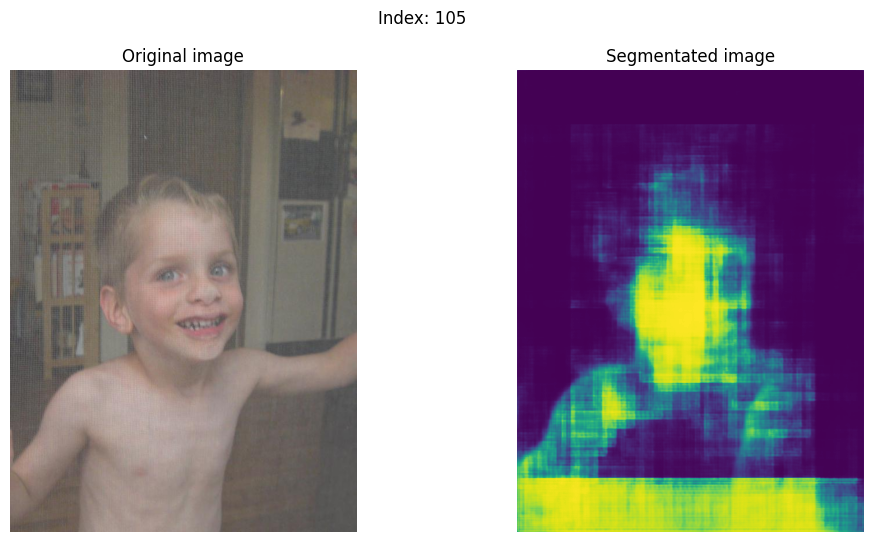

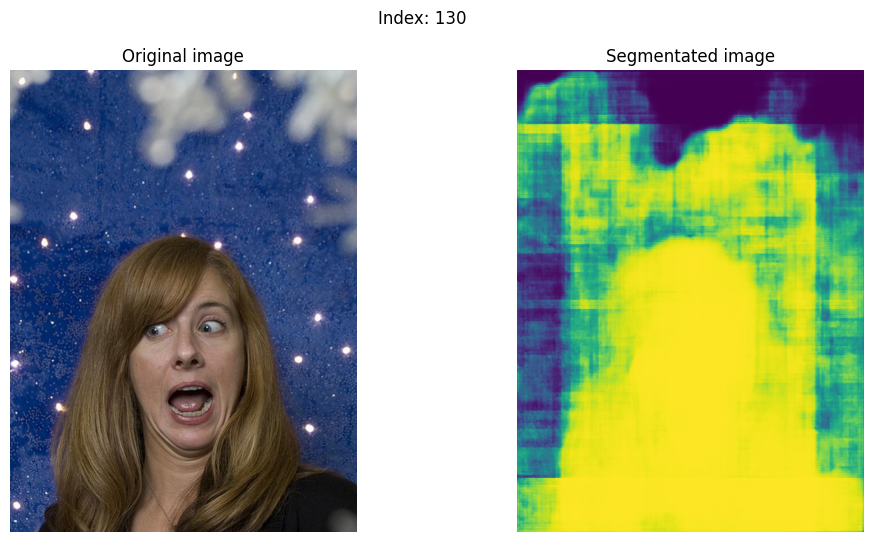

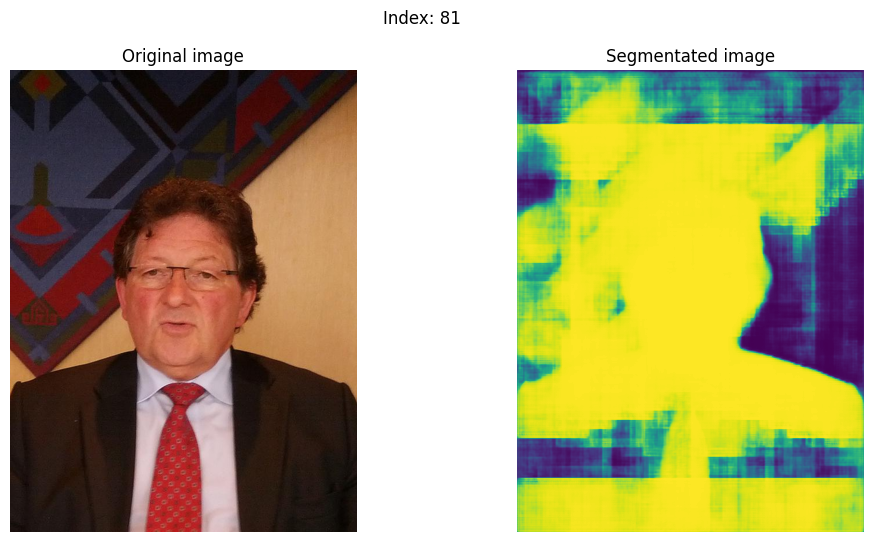

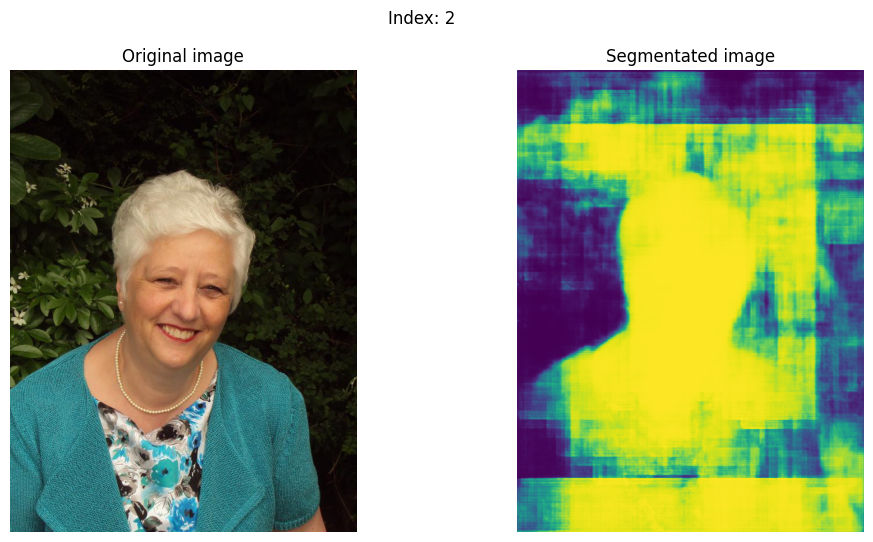

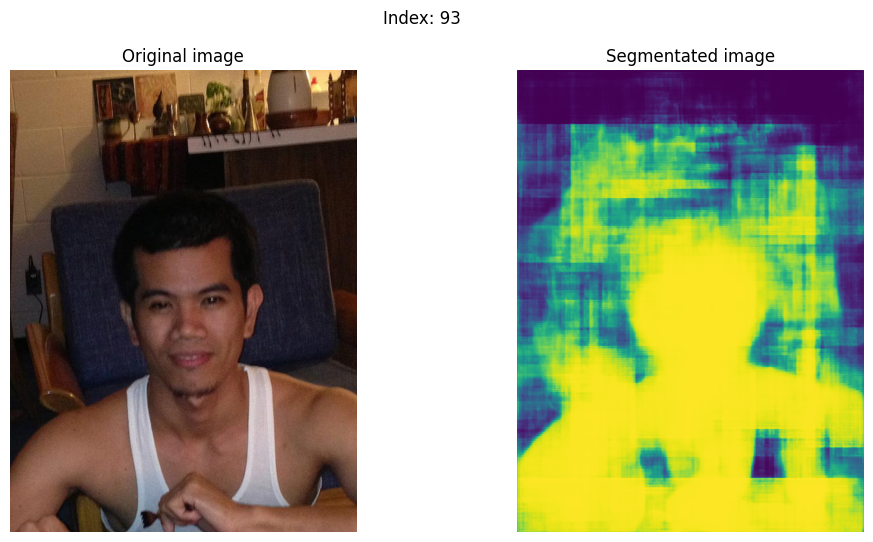

In [83]:
default_worst_predicts = show_worst_predicts(model, 5)

Попробуем улучшить качество не меняя архитектуру.

Аугментация. Добавим в тренировочный датасет дополнительные изображения, полученные из исходных горизонтальным поворотом и изменением яркости.

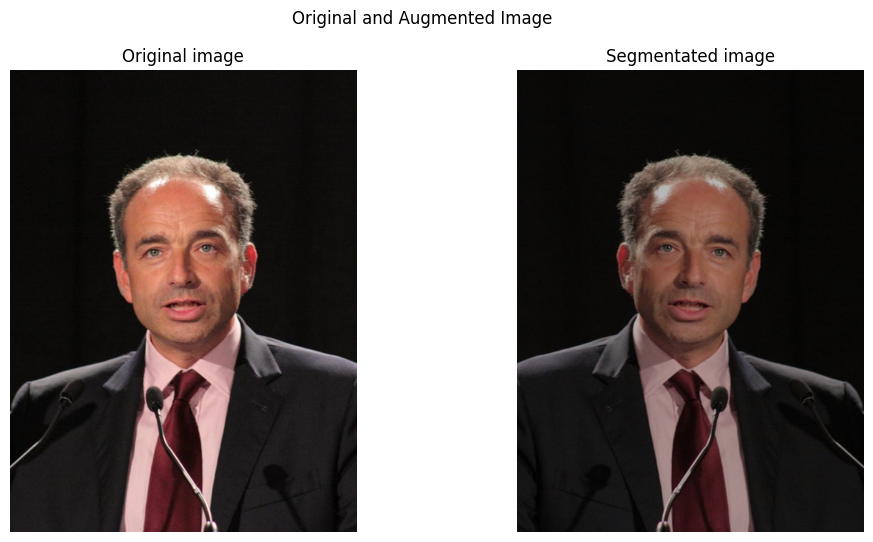

In [59]:
augmentations = transforms.Compose([
    transforms.RandomHorizontalFlip(p=1),
    transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
])

train_dataset_augmented = copy.deepcopy(train_dataset)
train_dataset_augmented.transform = augmentations

image, _ = train_dataset[0]
augmented_image, _ = train_dataset_augmented[0]
show_images(image, augmented_image, title="Original and Augmented Image")

train_dataset_extended = ConcatDataset([train_dataset, train_dataset_augmented])
train_loader_extended = DataLoader(train_dataset_extended, batch_size=batch_size, shuffle=True)

In [65]:
def train_n_levels(
        n_epochs: int,
        ns_levels: List[int],
        train_loader: DataLoader,
        test_loader: DataLoader,
        dump_path: Union[Path, str],
        device: torch.device
):
    dump_path = Path(dump_path)
    dump_path.mkdir(parents=True, exist_ok=True)

    results_per_level = []
    for n_levels in ns_levels:
        print(f"Training Unet with {n_levels} levels")
        model = UNet(n_levels=n_levels).to(device)
        optimizer = torch.optim.Adam(model.parameters())

        model_name = f"{n_levels}_levels"
        model_dir = dump_path / model_name
        model_dir.mkdir(parents=True, exist_ok=True)

        results = train(
            model, optimizer, train_loader, test_loader,
            loss_fn, jaccard,
            epochs=n_epochs,
            device=device,
            artifacts=model_dir / "artifacts"
        )

        results_per_level.append(results)
        results.to_csv(model_dir / "results.csv", index=False)
    return results_per_level

results_per_level = train_n_levels(n_epochs=20,
                                   ns_levels=[3, 4, 5, 6],
                                   train_loader=train_loader_extended,
                                   test_loader=test_loader,
                                   dump_path='task06/models/n_levels/',
                                   device=device)

Training Unet with 4 levels


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 100%|██████████| 20/20 [36:29<00:00, 109.47s/it]


Training Unet with 5 levels


Epoch:   0%|          | 0/20 [00:00<?, ?it/s]/home/arno/prog/spbu/ml-course/venv/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
/home/arno/prog/spbu/ml-course/venv/lib/python3.12/site-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
Epoch: 100%|██████████| 20/20 [37:44<00:00, 113.22s/it]


Training Unet with 6 levels


Epoch: 100%|██████████| 20/20 [39:04<00:00, 117.24s/it]


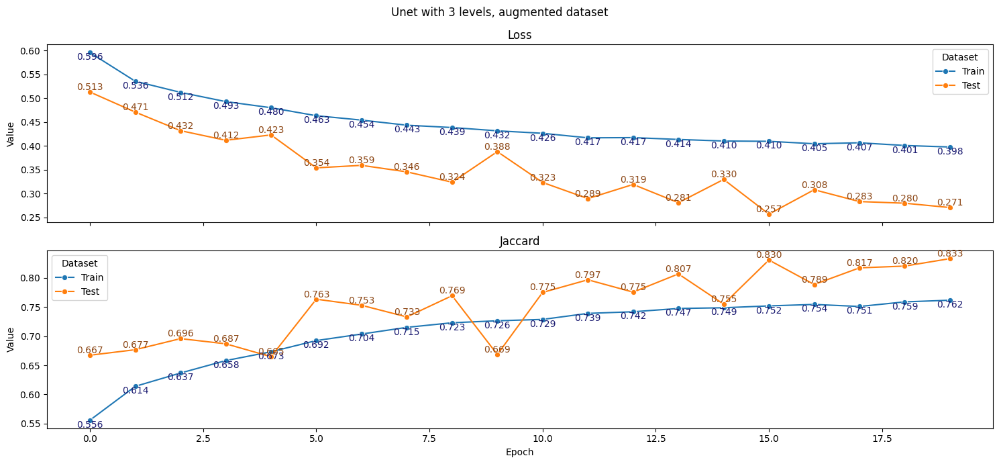

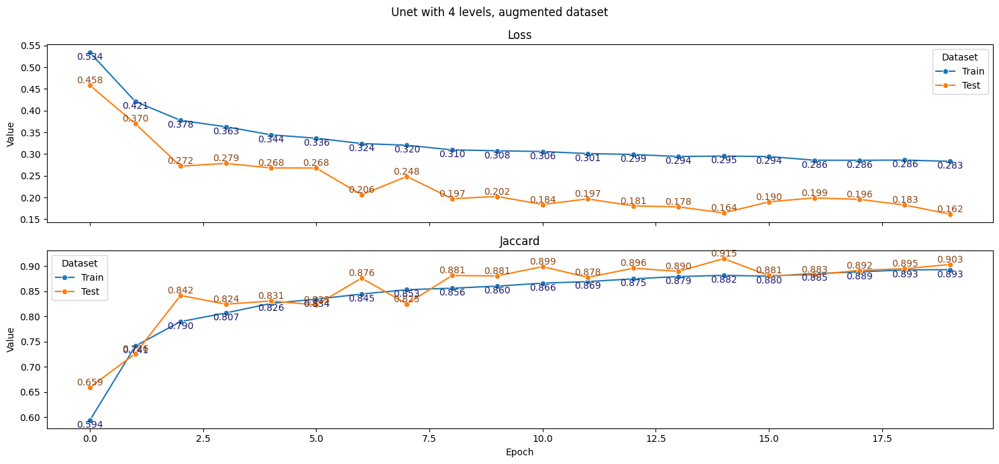

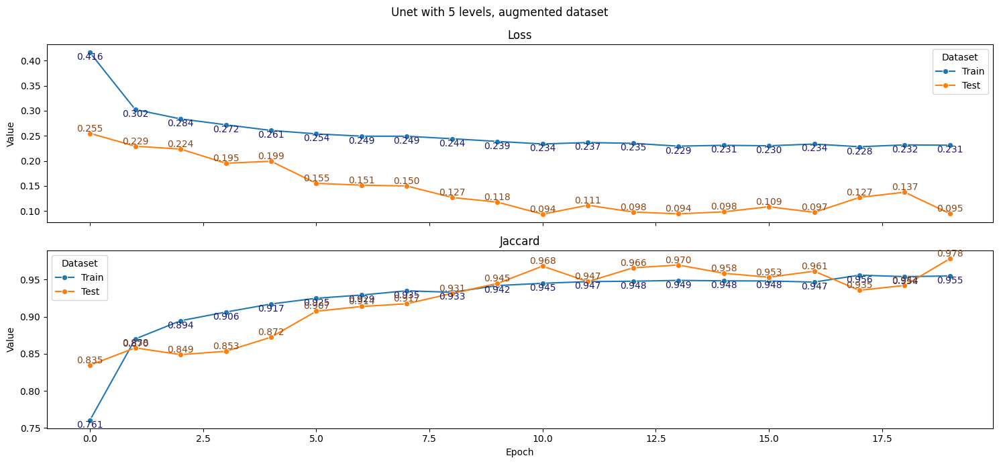

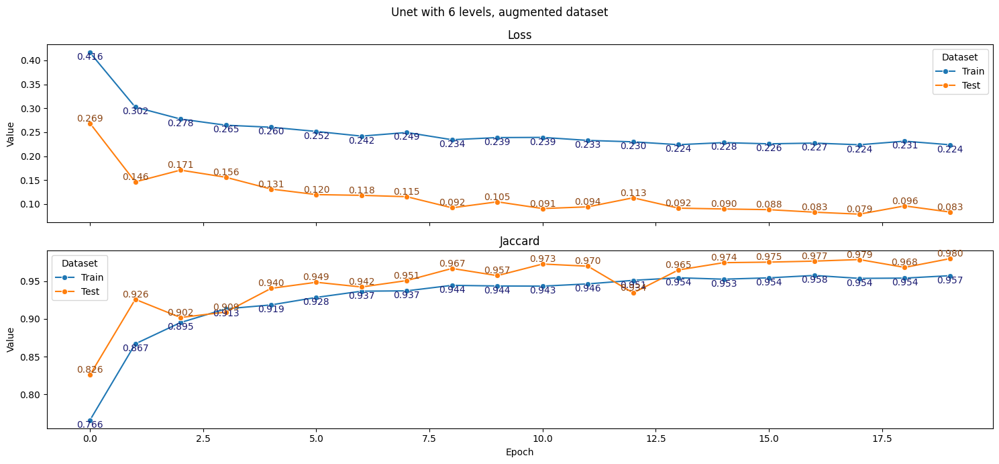

In [84]:
for n_levels in [3, 4, 5, 6]:
    results = pd.read_csv(f'task06/models/n_levels/{n_levels}_levels/results.csv')
    plot(results, title=f"Unet with {n_levels} levels, augmented dataset")

Посмотрим, как изменились худшие случаи для модели с четырьмя уровнями по сравнению с моделью, обученной на данных без аугментации.

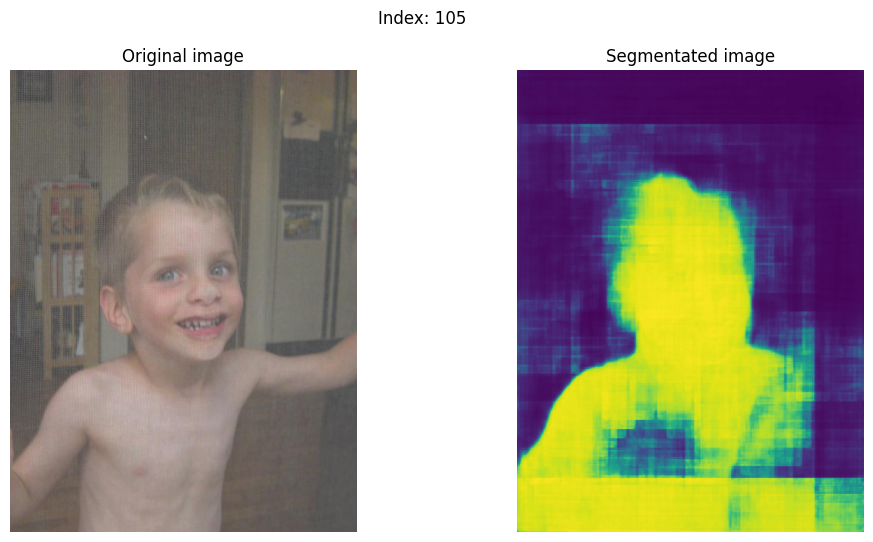

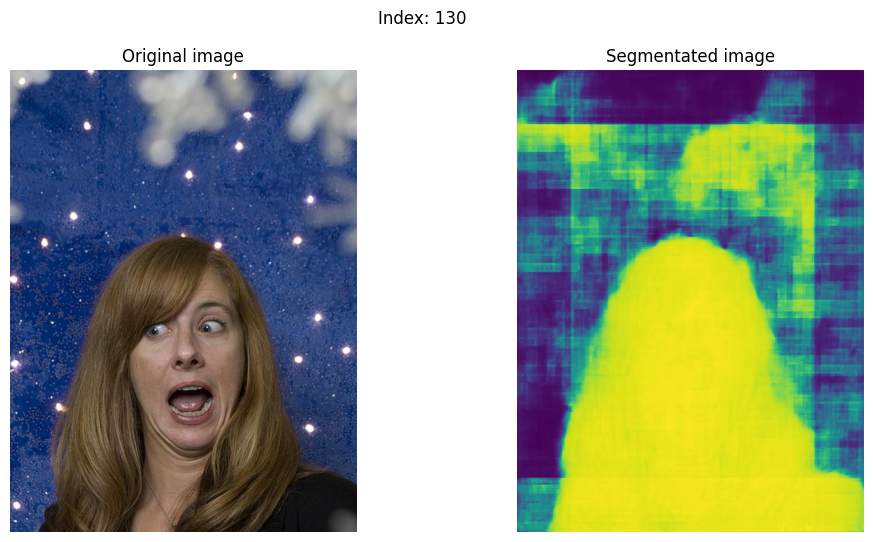

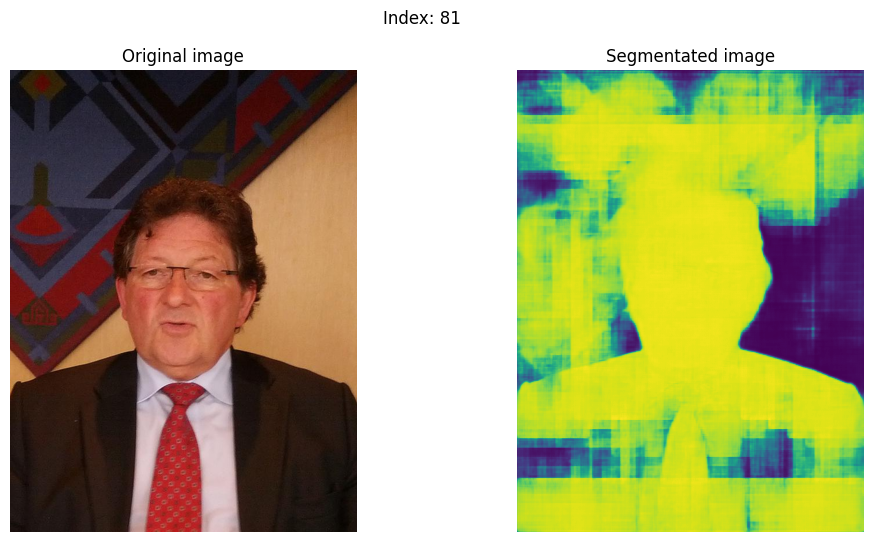

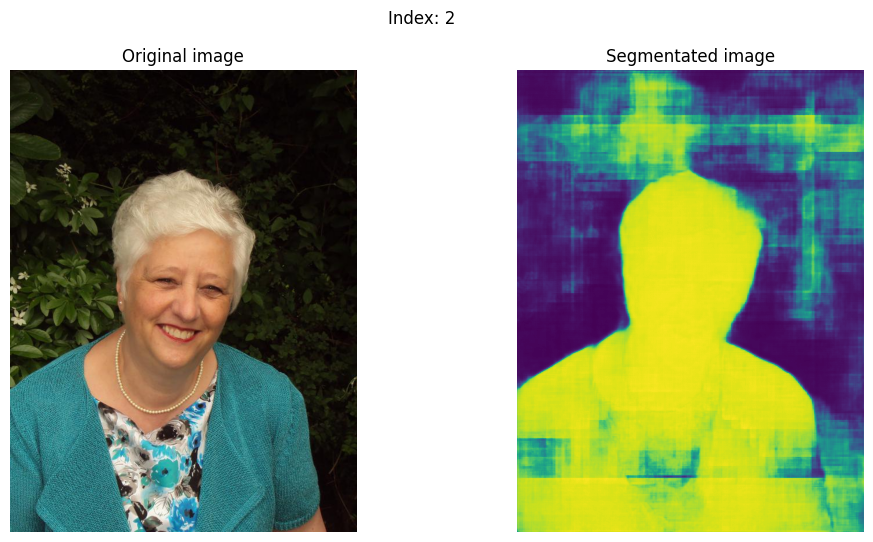

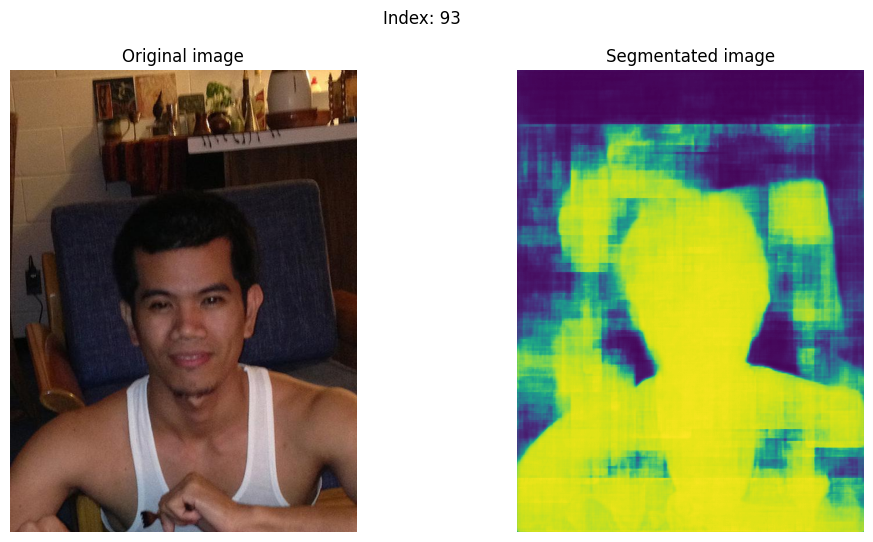

[105, 130, 81, 2, 93]

In [85]:
model = UNet()
model.load_state_dict(torch.load("task06/models/n_levels/4_levels/artifacts/epoch_11.pt"))
model.to(device).eval()
show_worst_predicts(model, 5, default_worst_predicts)

Качество все ещё не очень, однако видно, что стало заметно лучше.

Посмотрим на худшие предсказания для модели с 6ью уровнями.

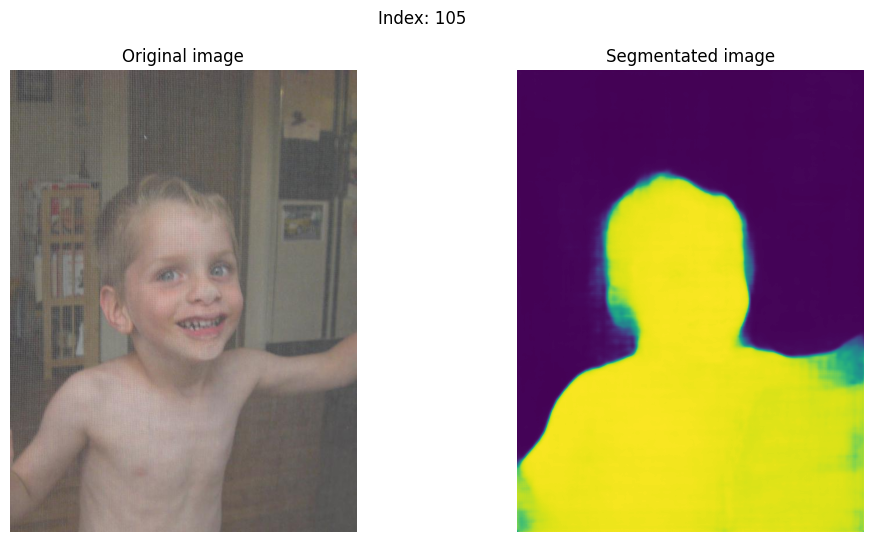

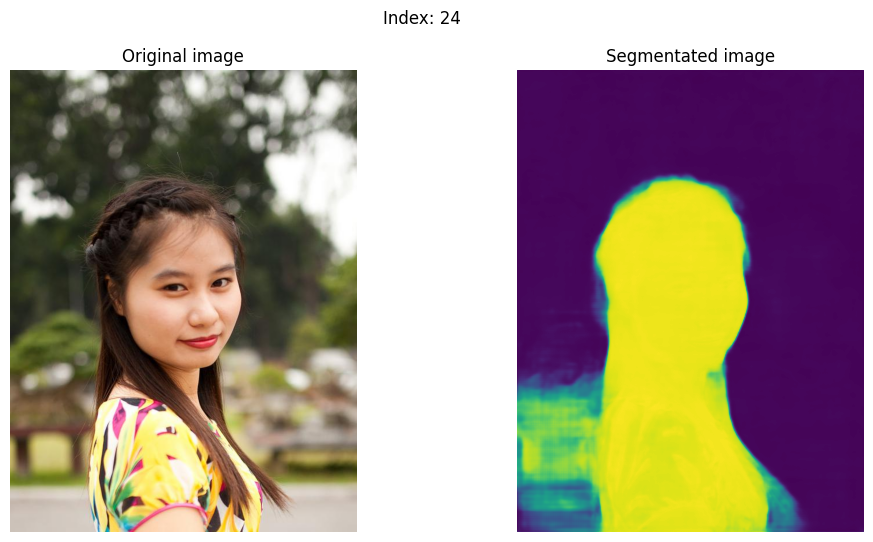

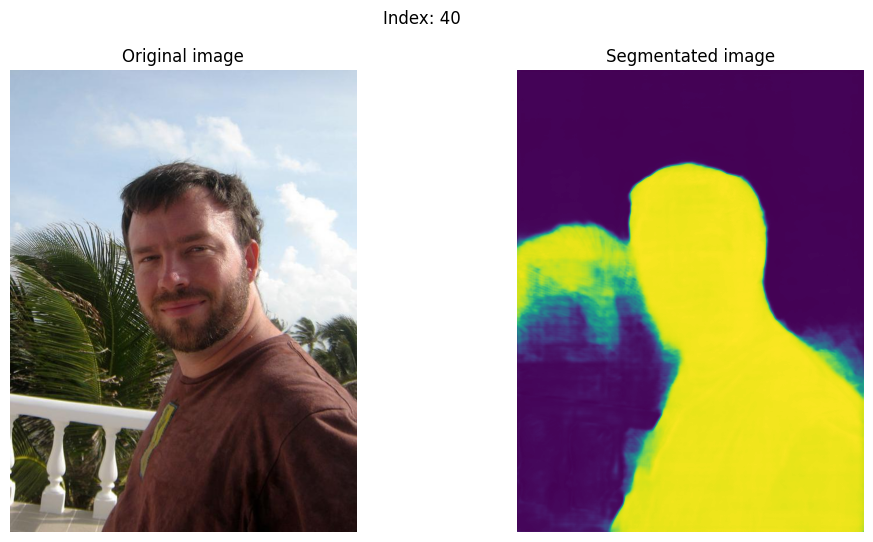

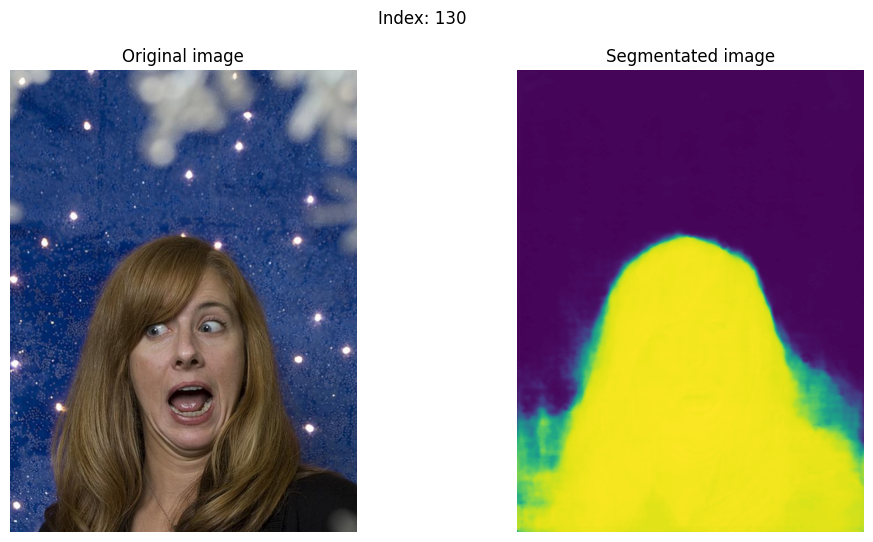

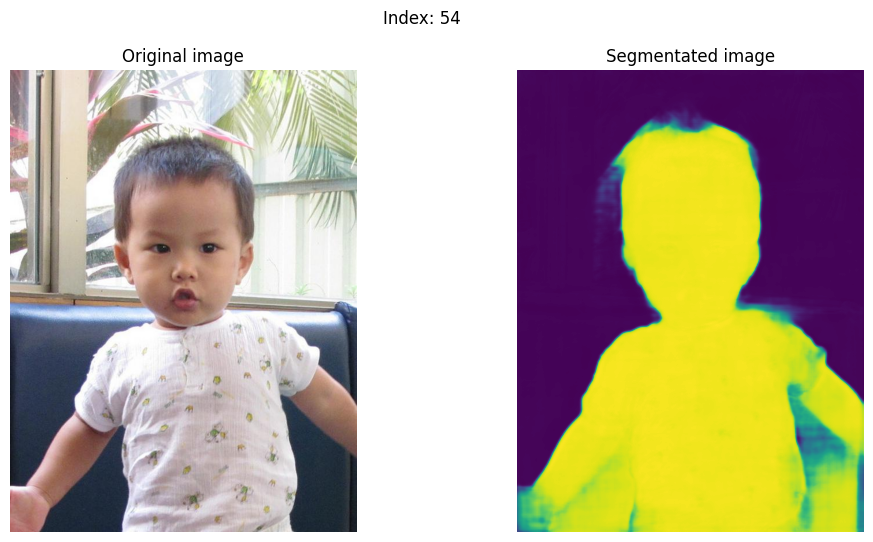

[105, 24, 40, 130, 54]

In [86]:
model = UNet(n_levels=6)
model.load_state_dict(torch.load("task06/models/n_levels/6_levels/artifacts/epoch_19.pt"))
model.to(device).eval()
show_worst_predicts(model, 5)

Все эти случаи довольно сложны из-за неудачных фонов, однако модель все равно довольно неплохо справляется с сегментацией.

Реализуем test-time аугментацию через horizontal flip

In [91]:
class UNetWithHFlipAugmentation(nn.Module):
    def __init__(self, in_channels: int = 3, out_channels: int = 1, n_levels: int = 4):
        super().__init__()
        self.unet = UNet(in_channels, out_channels, n_levels)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x_flipped = torch.flip(x, dims=[-1])

        x_combined = torch.cat([x, x_flipped], dim=0)
        x_combined_output = self.unet(x_combined)

        x_output, x_flipped_output = torch.chunk(x_combined_output, chunks=2, dim=0)
        x_flipped_output = torch.flip(x_flipped_output, dims=[-1])

        mean_output = torch.mean(torch.stack([x_output, x_flipped_output]), dim=0)

        return mean_output

test_time_model = UNetWithHFlipAugmentation(n_levels=6).to(device)
test_time_model.unet.load_state_dict(model.state_dict());
evaluate(test_time_model, test_loader, loss_fn, jaccard, device)

Evaluating batch: 100%|██████████| 1/1 [00:00<00:00, 12.63it/s]


(0.08422788232564926, 0.9782689809799194)

Качество (метрики) модели с 6ью уровнями почти не изменилось и даже стало чуть хуже с применением test-time аугментации, но разница совсем маленькая.

Улучшение качества с помощью изменения архитектуры.
Добавим Droupout после каждой функции активации, чтобы уменьшить оверфиттинг.

In [167]:
class DoubleConvWithDropout(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, padding: int, dropout_prob: int = 0.5):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.double_conv(x)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.double_conv(x)

class UNetEncoderWithDropout(nn.Module):
    def __init__(self, in_channels: int, n_down: int, channels_factor: int = 2, padding: int = 1):
        super().__init__()

        self.enc_layers = nn.ModuleList([DoubleConvWithDropout(in_channels, in_channels * channels_factor, padding)])

        for _ in range(n_down):
            in_channels *= channels_factor
            self.enc_layers.append(
                nn.Sequential(
                    nn.MaxPool2d(2, 2),
                    DoubleConvWithDropout(in_channels, in_channels * channels_factor, padding)
                )
            )

    def forward(self, x: torch.Tensor) -> list[torch.Tensor]:
        results = []
        for layer in self.enc_layers:
            x = layer(x)
            results.append(x)
        return results

class UNetDecoderWithDropout(nn.Module):
    def __init__(self, in_channels: int, n_up: int, channels_divisor: int = 2, padding: int = 1):
        super().__init__()

        self.dec_layers = nn.ModuleList()
        for _ in range(n_up):
            out_channels = in_channels // channels_divisor
            self.dec_layers.append(
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
            )
            self.dec_layers.append(
                DoubleConvWithDropout(in_channels, out_channels, padding)
            )
            in_channels = out_channels

    def forward(self, x: torch.Tensor, residuals: list[torch.Tensor]) -> torch.Tensor:
        assert len(residuals) == len(self.dec_layers) // 2, "Mismatch in number of residuals and decoder layers"

        for i in range(0, len(self.dec_layers), 2):
            up_conv = self.dec_layers[i]
            double_conv = self.dec_layers[i+1]
            residual = residuals[-(i//2+1)]

            x = up_conv(x)
            h_diff = residual.size(2) - x.size(2)
            w_diff = residual.size(3) - x.size(3)
            if h_diff > 0 or w_diff > 0:
                x = nn.functional.pad(x, [0, w_diff, 0, h_diff])

            x = torch.cat([residual, x], dim=1)
            x = double_conv(x)
            
        return x

class UNetWithDropout(nn.Module):
    def __init__(self, in_channels: int = 3, out_channels: int = 1, n_levels: int = 4):
        super().__init__()

        self.encoder = UNetEncoderWithDropout(in_channels=in_channels, n_down=n_levels)
        encoder_out_channels = in_channels * (2 ** (n_levels + 1))
        self.decoder = UNetDecoderWithDropout(in_channels=encoder_out_channels, n_up=n_levels)
        self.out_conv = nn.Conv2d(in_channels=in_channels * 2, out_channels=out_channels, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residuals = self.encoder(x)
        x = self.decoder(residuals[-1], residuals[:-1])
        x = self.out_conv(x)
        return x

In [168]:
dropout_model = UNetWithDropout().to(device)
optimizer = torch.optim.Adam(dropout_model.parameters())

train(
    dropout_model, optimizer, train_loader, test_loader, loss_fn, jaccard,
    epochs=20,
    device=device,
    artifacts="task06/models/dropout/artifacts/",
).to_csv("task06/models/dropout/results.csv")

Epoch:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 100%|██████████| 20/20 [21:53<00:00, 65.67s/it]


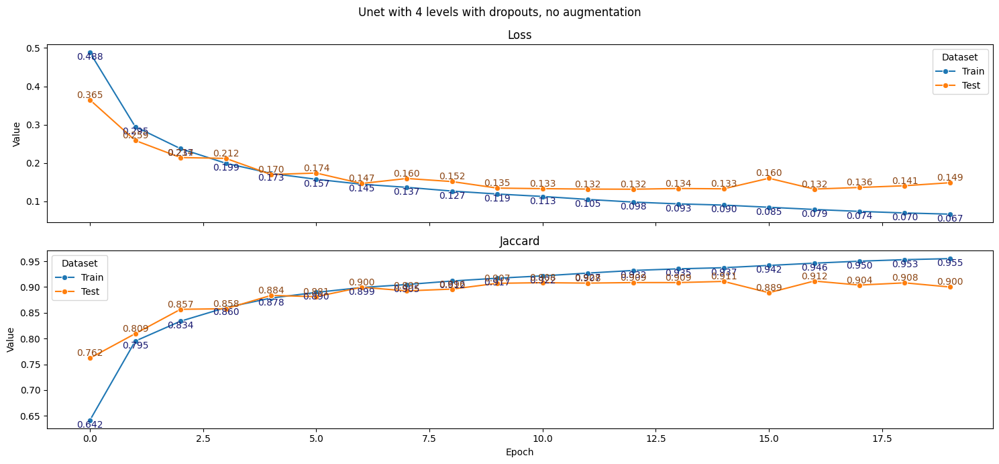

In [169]:
plot(pd.read_csv("task06/models/dropout/results.csv"), "Unet with 4 levels with dropouts, no augmentation")

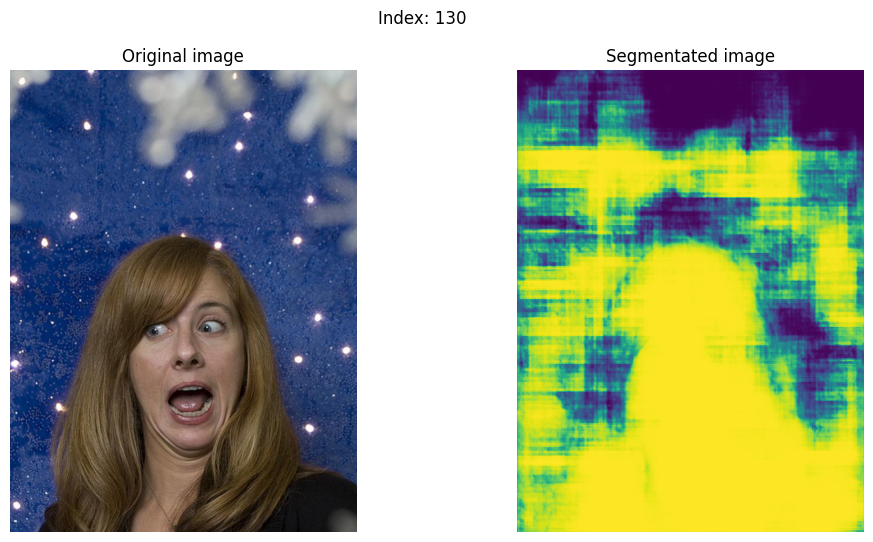

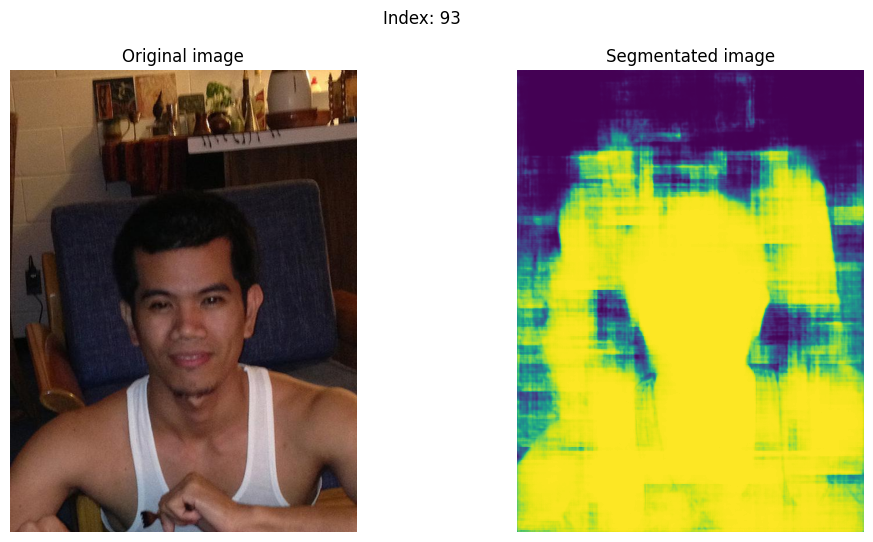

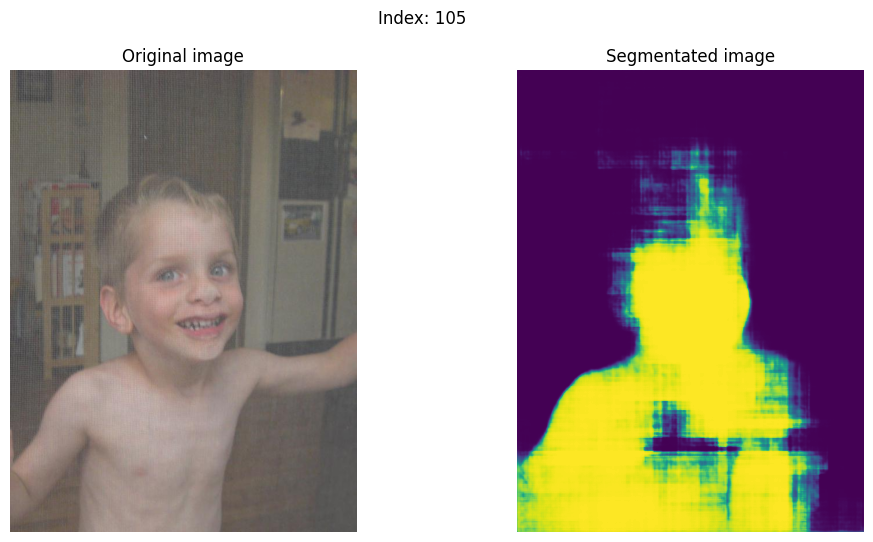

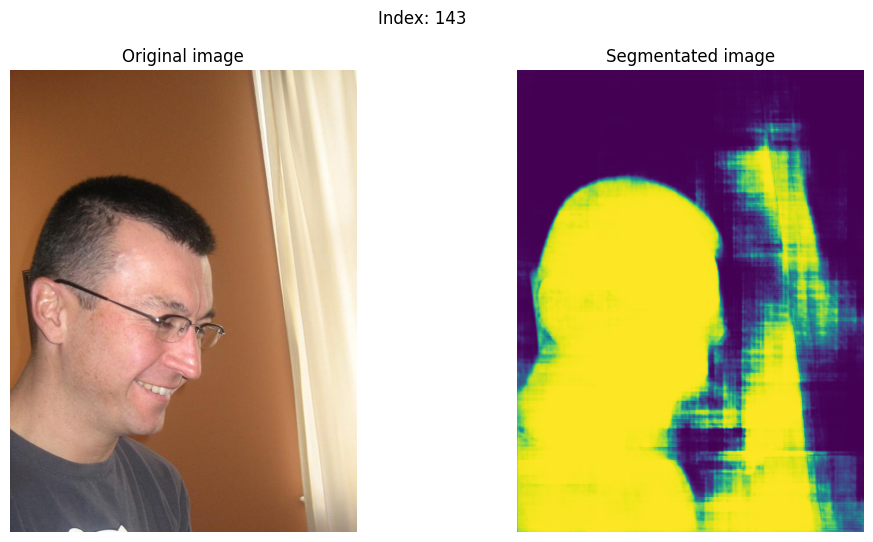

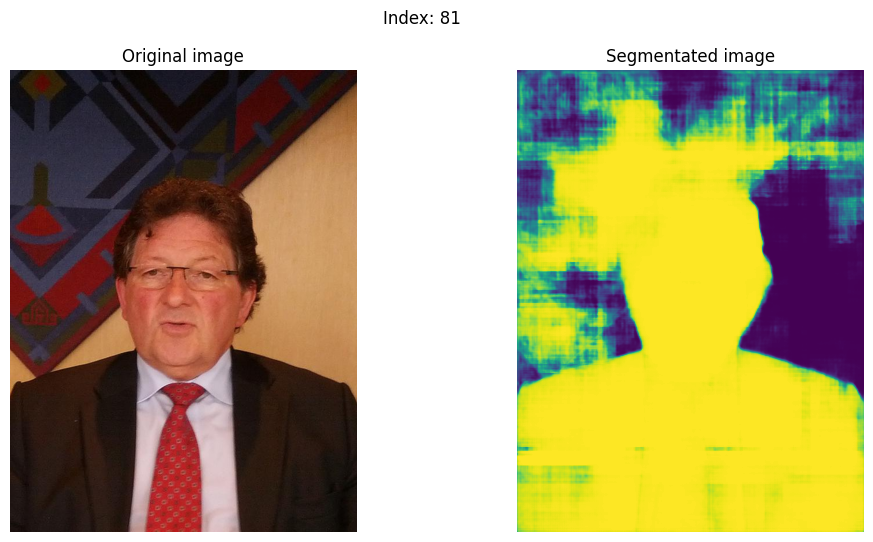

[130, 93, 105, 143, 81]

In [170]:
dropout_model = UNetWithDropout().to(device)
dropout_model.load_state_dict(torch.load("task06/models/dropout/artifacts/epoch_19.pt"))
dropout_model.to(device).eval()
show_worst_predicts(dropout_model, 5)